# **UNIVERSIDAD TÉCNICA PARTICULAR DE LOJA**

<img src="https://drive.google.com/uc?id=1X5UmWVlUX9XmckJgFLmv6mTTX81GEr0c" width="300">


## **FACULTAD DE INGENIERÍAS Y ARQUITECTURA**

## **MAESTRÍA EN INTELIGENCIA ARTIFICIAL APLICADA**


## **Proyecto final**
---

*Autor*: **Freddy Hernán Villota González**

*Docente*: **M.Sc. Alexandra Cristina González Eras**

*Fecha*: **03 de mayo de 2025**


---

## Clonar repositorio GIT

### 2.1. 📂 Crear el repositorio en GitHub

https://github.com/FreddyHVG/miaa-final-project.git

### 2.2. 📁 Montar Google Drive en Colab

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### 2.3. 🛠️ Clonar el repositorio en la carpeta de trabajo en drive

**Solo se necesita hacer una vez**

In [ ]:
%cd /content/drive/MyDrive/MIAA/Clases/Herramientas IA/Prácticas

/content/drive/MyDrive/MIAA/Clases/Herramientas IA/Prácticas


Ubicarse en la dirección de la carpeta a guardar el clone del repositorio

In [ ]:
#!git clone https://github.com/FreddyHVG/miaa-final-project.git
#%cd miaa-final-project

Cloning into 'miaa-final-project'...
remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 4 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (4/4), done.
/content/drive/MyDrive/MIAA/Clases/Herramientas IA/Prácticas/miaa-final-project


## Configurar GEE en colab y seleccionar área de estudio

### 3.1. Instalar geemap e inicializar

In [2]:
# Instalar geemap (si no está instalado)
!pip install geemap --upgrade

import geemap
import ee
ee.Authenticate()
ee.Initialize(project="ee-freddyvillota")

### 3.2. Definir área de estudio y periodo

**Explorar provincias y cantones de interés para el estudio**

Análisis espacial detallado (ej. intersecciones, buffers)	usar FAO/GAUL/2015/level2 ✅

Mostrar ubicación general en un mapa rápido	FAO/GAUL_SIMPLIFIED_500m/2015

In [ ]:
# Cargar colección de nivel 2 (cantones)
ec_provincias = ee.FeatureCollection("FAO/GAUL/2015/level1") \
    .filter(ee.Filter.eq("ADM0_NAME", "Ecuador"))

# Obtener los nombres únicos de cantones
provincias_list = ec_provincias.aggregate_array("ADM1_NAME").distinct()
print(provincias_list.getInfo())

['Napo', 'Orellana', 'Guayas', 'Pichincha', 'Santa Elena', 'Santo Domingo de los Tsachilas', 'Azuay', 'Bolivar', 'Canar', 'Carchi', 'Chimborazo', 'Cotopaxi', 'El Oro', 'Esmeraldas', 'Galapagos', 'Imbabura', 'Loja', 'Los Rios', 'Manabi', 'Morona Santiago', 'Pastaza', 'Sucumbios', 'Tungurahua', 'Zamora Chinchipe', 'Zona No Delimitada']


In [ ]:
# Cargar colección de nivel 2 (cantones)
ec_cantones = ee.FeatureCollection("FAO/GAUL_SIMPLIFIED_500m/2015/level2") \
    .filter(ee.Filter.eq("ADM0_NAME", "Ecuador")) \
    .filter(ee.Filter.eq("ADM1_NAME", "Carchi"))

# Obtener los nombres únicos de cantones
cantones_list = ec_cantones.aggregate_array("ADM2_NAME").distinct()
print(cantones_list.getInfo())

['Bolivar', 'Espejo', 'Mira', 'Montufar', 'San Pedro de Huaca', 'Tulcan']


**Definir mi área de estudio**

In [ ]:
roi = ee.FeatureCollection("FAO/GAUL_SIMPLIFIED_500m/2015/level2") \
    .filter(ee.Filter.eq("ADM0_NAME", "Ecuador")) \
    .filter(ee.Filter.eq("ADM1_NAME", "Carchi")) \
    .filter(ee.Filter.eq("ADM2_NAME", "Montufar"))  # nombre exacto sin tildes

**Explorar escenas para imágenes satelitales**

In [ ]:
def get_path_row(sensor_ic, year):
    collection = ee.ImageCollection(sensor_ic) \
        .filterBounds(roi) \
        .filterDate(f"{year}-01-01", f"{year}-12-31")

    paths = collection.aggregate_array("WRS_PATH").distinct()
    rows = collection.aggregate_array("WRS_ROW").distinct()

    return paths, rows

# Sensores y años
sources = [
    ("LANDSAT/LT05/C02/T1_L2", 1995),
    ("LANDSAT/LT05/C02/T1_L2", 2000),
    ("LANDSAT/LE07/C02/T1_L2", 2005),
    ("LANDSAT/LE07/C02/T1_L2", 2010),
    ("LANDSAT/LC08/C02/T1_L2", 2015),
    ("LANDSAT/LC08/C02/T1_L2", 2020),
    ("LANDSAT/LC09/C02/T1_L2", 2024),
]

# Obtener y mostrar path/row por año
for ic, yr in sources:
    p, r = get_path_row(ic, yr)
    print(f"Año {yr} - Sensor {ic.split('/')[1]}:")
    print("Paths:", p.getInfo())
    print("Rows :", r.getInfo())
    print("------")


Año 1995 - Sensor LT05:
Paths: [9, 10]
Rows : [60, 59]
------
Año 2000 - Sensor LT05:
Paths: [9, 10]
Rows : [60, 59]
------
Año 2005 - Sensor LE07:
Paths: [9, 10]
Rows : [60, 59]
------
Año 2010 - Sensor LE07:
Paths: [9, 10]
Rows : [60, 59]
------
Año 2015 - Sensor LC08:
Paths: [9, 10]
Rows : [60, 59]
------
Año 2020 - Sensor LC08:
Paths: [9, 10]
Rows : [60, 59]
------
Año 2024 - Sensor LC09:
Paths: [9, 10]
Rows : [60, 59]
------


### 3.3. Máscara de nubes

In [ ]:
# ----------------------
# 1. Funciones de máscara por sensor
# ----------------------

def mask_landsat5_sr(image):
    qa = image.select('QA_PIXEL')
    cloud = 1 << 3
    shadow = 1 << 4
    snow = 1 << 5
    mask = qa.bitwiseAnd(cloud).eq(0) \
             .And(qa.bitwiseAnd(shadow).eq(0)) \
             .And(qa.bitwiseAnd(snow).eq(0))
    return image.updateMask(mask) \
                .select(['SR_B1','SR_B2','SR_B3','SR_B4','SR_B5','SR_B7']) \
                .multiply(0.0000275).add(-0.2)

def mask_landsat8_9_sr(image):
    qa = image.select('QA_PIXEL')
    cloud = 1 << 3
    shadow = 1 << 4
    snow = 1 << 5
    mask = qa.bitwiseAnd(cloud).eq(0) \
             .And(qa.bitwiseAnd(shadow).eq(0)) \
             .And(qa.bitwiseAnd(snow).eq(0))
    return image.updateMask(mask) \
                .select(['SR_B2','SR_B3','SR_B4','SR_B5','SR_B6','SR_B7']) \
                .multiply(0.0000275).add(-0.2)

**Probar disponibilidad de imagenes**

In [ ]:
import ee
import geemap

# === Cargar y procesar la mejor imagen de 2000 ===
# LANDSAT/LT05/C02/T1_L2
# LANDSAT/LC08/C02/T1_L2
# LANDSAT/LC09/C02/T1_L2
landsattest = ee.ImageCollection("LANDSAT/LC09/C02/T1_L2") \
    .filterBounds(roi) \
    .filterDate("2024-01-01", "2024-12-31") \
    .filter(ee.Filter.eq("WRS_PATH", 10)) \
    .filter(ee.Filter.eq("WRS_ROW", 60)) \
    .sort("CLOUD_COVER")

imagetest = landsattest.first()
imagetest_clean = mask_landsat8_9_sr(imagetest).clip(roi) # mask_landsat8_9_sr; mask_landsat5_sr

# Obtener la segunda imagen (índice 1)
imagetest2 = ee.Image(landsattest.toList(landsattest.size()).get(2))
imagetest2_clean = mask_landsat8_9_sr(imagetest2).clip(roi) # mask_landsat8_9_sr; mask_landsat5_sr

# === Visualización ===
vis_params = {
    'bands': ['SR_B4', 'SR_B3', 'SR_B2'],  # RGB natural - L8 4-3-2; L5 3-2-1
    'min': 0.0,
    'max': 0.3,
    'gamma': 1.3
}
# Estilo: borde rojo, sin relleno (ancho 2 px)
outline_style_roi = {
    'color': 'red',
    'width': 2,
    'fillColor': '00000000'  # Transparente
}

outline_style_ecuador = {
    'color': 'blue',
    'width': 2,
    'fillColor': '00000000'  # Transparente
}

Map = geemap.Map()
Map.add_basemap("SATELLITE")
Map.centerObject(roi, 10)
Map.addLayer(imagetest_clean, vis_params, 'Landsat test (clipped & masked)')
Map.addLayer(roi.style(**outline_style_roi), {}, "Cantón Montúfar - Borde rojo")
Map

Map(center=[0.5671565338908651, -77.81536612598045], controls=(WidgetControl(options=['position', 'transparent…

**Hallazgos**

ID: LANDSAT/LT05/C02/T1_L2/LT05_010060_19960724
   Fecha: 1996-07-24
   CLOUD_COVER: 11

ID: LANDSAT/LC08/C02/T1_L2/LC08_010060_20170123
   Fecha: 2017-01-23
   CLOUD_COVER: 33.25

ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20240830
   Fecha: 2024-08-30
   CLOUD_COVER: 21.53

**Puedo definir otra área de estudio dibujando en el mapa**

- Hacer clic en el ícono del rectángulo (barra superior izquierda) para dibujar un polígono o rectángulo sobre la zona que te interese analizar.
- Luego de dibujar, ejecutar la siguiente celda para capturar el ROI

In [ ]:
#roi = Map.user_roi # Esto es un ee.Feature
#Map.addLayer(roi, {'color': 'red'}, 'ROI dibujado')
#roi

**Verificar listado de imágenes**

In [ ]:
# Convertir la colección a lista
image_list = landsattest.toList(landsattest.size())

# Mostrar info básica de cada imagen
for i in range(landsattest.size().getInfo()):
    image = ee.Image(image_list.get(i))
    info = image.select(0).getInfo()  # cualquier banda para acceder a propiedades
    print(f"{i+1}. ID: {info['id']}")
    print(f"   Fecha: {info['properties']['DATE_ACQUIRED']}")
    print(f"   CLOUD_COVER: {info['properties']['CLOUD_COVER']}")

1. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20240830
   Fecha: 2024-08-30
   CLOUD_COVER: 21.53
2. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20240510
   Fecha: 2024-05-10
   CLOUD_COVER: 44.86
3. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20241017
   Fecha: 2024-10-17
   CLOUD_COVER: 47.58
4. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20241102
   Fecha: 2024-11-02
   CLOUD_COVER: 55.69
5. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20240814
   Fecha: 2024-08-14
   CLOUD_COVER: 59.25
6. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20240915
   Fecha: 2024-09-15
   CLOUD_COVER: 60.14
7. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20240204
   Fecha: 2024-02-04
   CLOUD_COVER: 61.32
8. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20240408
   Fecha: 2024-04-08
   CLOUD_COVER: 63.55
9. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20240729
   Fecha: 2024-07-29
   CLOUD_COVER: 68.33
10. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20240424
   Fecha: 2024-04-24
   CLOUD_COVER: 70.07
11. ID: LANDSAT/LC09/C02/T1_L2/LC09_010060_20240526
   Fech

**Adquirir imágenes definitivas**

In [ ]:
import ee
import geemap

# Inicializar Earth Engine
Map = geemap.Map()

# ROI ejemplo: debe estar definido previamente en tu notebook
# roi = ee.FeatureCollection(...).geometry()



# ----------------------
# 2. Diccionario de sensores por año
# ----------------------

years_info = {
    1996: ("LANDSAT/LT05/C02/T1_L2", mask_landsat5_sr),
    2017: ("LANDSAT/LC08/C02/T1_L2", mask_landsat8_9_sr),
    2024: ("LANDSAT/LC09/C02/T1_L2", mask_landsat8_9_sr)
}

# ----------------------
# 3. Visualización y extracción
# ----------------------

vis_params_dict = {
    '1996': ['SR_B3', 'SR_B2', 'SR_B1'],
    '2017': ['SR_B4', 'SR_B3', 'SR_B2'],
    '2024': ['SR_B4', 'SR_B3', 'SR_B2']
}

images = {}

for year, (collection_id, mask_fn) in years_info.items():
    col = ee.ImageCollection(collection_id) \
        .filterBounds(roi) \
        .filterDate(f"{year}-01-01", f"{year}-12-31") \
        .filter(ee.Filter.eq("WRS_PATH", 10)) \
        .filter(ee.Filter.eq("WRS_ROW", 60)) \
        .sort("CLOUD_COVER")

    img = col.first()
    if img:
        processed = mask_fn(img).clip(roi)
        images[year] = processed
        Map.addLayer(processed, {
            'bands': vis_params_dict[str(year)],
            'min': 0.0,
            'max': 0.3,
            'gamma': 1.3
        }, f"Landsat {year}")

Map.add_basemap("SATELLITE")
Map.addLayer(roi.style(**outline_style_roi), {}, "Cantón Montufar - Borde rojo")
Map.centerObject(roi, 10)
Map

Map(center=[0.5671565338908651, -77.81536612598045], controls=(WidgetControl(options=['position', 'transparent…

**Puntos etiquetados para clasificación supervisada**

Dibujar puntos en el mapa y luego ejecutar la celda, posteriormente limpiar el mapa y continuar con la siguiente clase.

1. Agua

In [ ]:
# Dibujar puntos de agua
labelagua2024 = Map.user_rois.map(lambda f: f.set('class', 0))
labelagua2024

2. Bosque

In [ ]:
# Dibujar puntos de bosque
labelbosque2024 = Map.user_rois.map(lambda f: f.set('class', 1))
labelbosque2024

3. Zona urbana

In [ ]:
# Dibujar puntos de zona urbana
labelzonaurbana2024 = Map.user_rois.map(lambda f: f.set('class', 2))
labelzonaurbana2024

4. Cultivos

In [ ]:
# Dibujar puntos de cultivos
labelcultivo2024 = Map.user_rois.map(lambda f: f.set('class', 3))
labelcultivo2024

5. Suelo

In [ ]:
# Dibujar puntos de cultivos
labelsuelo2024 = Map.user_rois.map(lambda f: f.set('class', 4))
labelsuelo2024

**Unir y exportar a drive**

In [ ]:
labels2024 = labelagua2024.merge(labelbosque2024) \
                          .merge(labelcultivo2024) \
                          .merge(labelzonaurbana2024)\
                          .merge(labelsuelo2024)
output_path = '/content/drive/MyDrive/MIAA/Clases/Herramientas IA/Prácticas/miaa-final-project/data/labels2024.geojson'
geemap.ee_export_vector(labels2024, filename=output_path)

Generating URL ...
Please wait ...
Data downloaded to /content/drive/MyDrive/MIAA/Clases/Herramientas IA/Prácticas/miaa-final-project/data/labels2024.geojson


### 3.4. Cladificación supervisada

**Cargar etiquetas (GeoJSON) desde Google Drive**

In [ ]:
# Cargar archivos GeoJSON con etiquetas
labels1996 = geemap.geojson_to_ee('/content/drive/MyDrive/MIAA/Clases/Herramientas IA/Prácticas/miaa-final-project/data/labels1996.geojson')
labels2017 = geemap.geojson_to_ee('/content/drive/MyDrive/MIAA/Clases/Herramientas IA/Prácticas/miaa-final-project/data/labels2017.geojson')
labels2024 = geemap.geojson_to_ee('/content/drive/MyDrive/MIAA/Clases/Herramientas IA/Prácticas/miaa-final-project/data/labels2024.geojson')

**Entrenamiento y clasificación para 1996 (Landsat 5)**

In [ ]:
#Definir las bandas para Landsat 5
bands_1996 = ['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B7']
# Extraer los valores de las bandas en los puntos de entrenamiento
training1996 = images[1996].select(bands_1996).sampleRegions(
    collection=labels1996,
    properties=['class'],
    scale=30
)
# Entrenar clasificador Random Forest
classifier1996 = ee.Classifier.smileRandomForest(100).train(
    features=training1996,
    classProperty='class',
    inputProperties=bands_1996
)

# Clasificar la imagen
classified1996 = images[1996].select(bands_1996).classify(classifier1996)

# Visualizar
# Paleta personalizada:
# Agua = Azul, Bosque = Verde oscuro, Urbano = Magenta, Cultivo = Verde claro,
#  Suelo = Marrón
class_palette = ['#1f78b4', '#006400', '#e7298a', '#7fc97f',  '#8c510a']

Map.addLayer(classified1996, {
    'min': 0,
    'max': 4,
    'palette': class_palette
}, 'Clasificación 1996 - 5 clases')
Map

Map(bottom=261609.0, center=[0.5733394303928371, -77.74088562037704], controls=(WidgetControl(options=['positi…

**Entrenamiento y clasificación para 2017 (Landsat 8)**

In [ ]:
# Definir las bandas para Landsat 8
bands_2017 = ['SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B6', 'SR_B7']

# Extraer los valores de las bandas en los puntos de entrenamiento
training2017 = images[2017].select(bands_2017).sampleRegions(
    collection=labels2017,
    properties=['class'],
    scale=30
)

# Entrenar clasificador Random Forest
classifier2017 = ee.Classifier.smileRandomForest(100).train(
    features=training2017,
    classProperty='class',
    inputProperties=bands_2017
)

# Clasificar la imagen
classified2017 = images[2017].select(bands_2017).classify(classifier2017)

# Visualizar con la misma paleta
# Paleta personalizada:
# Agua = Azul, Bosque = Verde oscuro, Urbano = Magenta, Cultivo = Verde claro,
#  Suelo = Marrón
class_palette = ['#1f78b4', '#006400', '#e7298a', '#7fc97f',  '#8c510a']

Map.addLayer(classified2017, {
    'min': 0,
    'max': 4,
    'palette': class_palette
}, 'Clasificación 2017 - 5 clases')
Map

Map(bottom=261740.0, center=[0.4834005055399857, -77.63865153262802], controls=(WidgetControl(options=['positi…

**Entrenamiento y clasificación para 2024 (Landsat 9)**

In [ ]:
# Definir las bandas para Landsat 9 (igual a Landsat 8)
bands_2024 = ['SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B6', 'SR_B7']

# Extraer los valores de las bandas en los puntos de entrenamiento
training2024 = images[2024].select(bands_2024).sampleRegions(
    collection=labels2024,
    properties=['class'],
    scale=30
)

# Entrenar clasificador Random Forest
classifier2024 = ee.Classifier.smileRandomForest(100).train(
    features=training2024,
    classProperty='class',
    inputProperties=bands_2024
)

# Clasificar la imagen
classified2024 = images[2024].select(bands_2024).classify(classifier2024)

# Visualizar con la misma paleta
Map.addLayer(classified2024, {
    'min': 0,
    'max': 4,
    'palette': class_palette
}, 'Clasificación 2024 - 5 clases')
Map

Map(bottom=261740.0, center=[0.4834005055399857, -77.63865153262802], controls=(WidgetControl(options=['positi…

### 3.5. Matriz de transición 1996 → 2024

**Preparar la matriz vacía**

In [ ]:
# Definir clases y matriz vacía
class_names = ['Agua', 'Bosque', 'Urbano', 'Cultivo', 'Suelo']
n_classes = len(class_names)
transition_matrix = pd.DataFrame(0, index=class_names, columns=class_names)

**Calcular cada transición (de i → j)**

In [ ]:
for i in range(n_classes):
    for j in range(n_classes):
        transition_mask = classified1996.eq(i).And(classified2024.eq(j))
        count = transition_mask.reduceRegion(
            reducer=ee.Reducer.sum(),
            geometry=roi,
            scale=30,
            maxPixels=1e9
        ).getInfo()

        value = list(count.values())[0] if count else 0
        transition_matrix.iloc[i, j] = int(value or 0)

**Visualizar como heatmap**

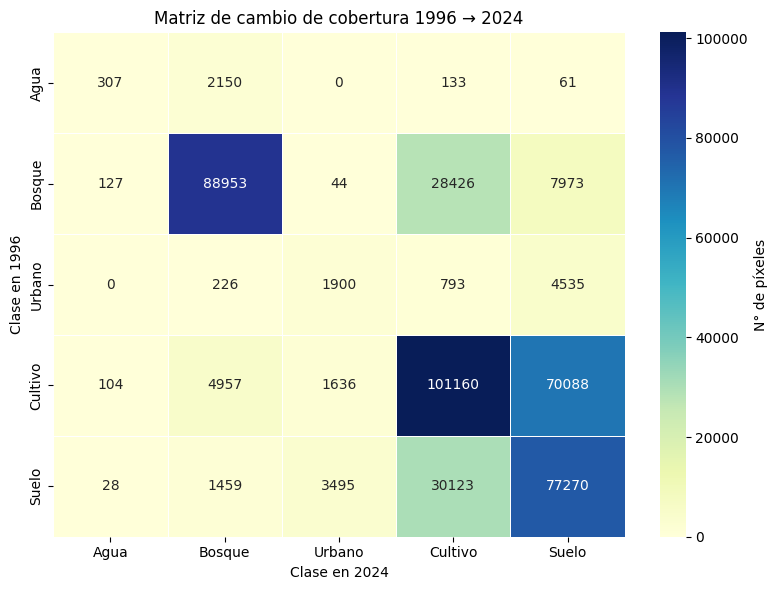

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.heatmap(transition_matrix, annot=True, fmt='d', cmap='YlGnBu', linewidths=.5, cbar_kws={'label': 'N° de píxeles'})
plt.title('Matriz de cambio de cobertura 1996 → 2024')
plt.ylabel('Clase en 1996')
plt.xlabel('Clase en 2024')
plt.tight_layout()
plt.show()

**Clase	con bservaciones clave**

Bosque → Cultivo	🔥 28,426 píxeles cambiaron de bosque a cultivo → indica fuerte presión agrícola

Cultivo → Suelo	🔥 70,088 píxeles pasaron de cultivo a suelo → puede sugerir abandono o degradación

Bosque → Suelo	❗ 7,973 píxeles pasaron directamente de bosque a suelo sin transición agrícola

Urbano → Urbano	🔵 1,900 píxeles permanecieron urbanos, crecimiento es menor comparado con otras

Agua → Bosque/Cultivo	🟡 Algunos píxeles de agua se convirtieron en otras coberturas (¿reducción de cuerpos de agua?)

**Contar cambios específicos (Bosque→Cultivo, Cultivo→Urbano)**

In [ ]:
# 1. Bosque (1) → Cultivo (3)
bosque_a_cultivo = classified1996.eq(1).And(classified2024.eq(3)).reduceRegion(
    reducer=ee.Reducer.sum(),
    geometry=roi,
    scale=30,
    maxPixels=1e9
).getInfo()

# 2. Cultivo (3) → Urbano (2)
cultivo_a_urbano = classified1996.eq(3).And(classified2024.eq(2)).reduceRegion(
    reducer=ee.Reducer.sum(),
    geometry=roi,
    scale=30,
    maxPixels=1e9
).getInfo()

# Mostrar los resultados
bosque_cultivo_val = list(bosque_a_cultivo.values())[0]
cultivo_urbano_val = list(cultivo_a_urbano.values())[0]

print(f"Bosque → Cultivo: {int(bosque_cultivo_val)} píxeles")
print(f"Cultivo → Urbano: {int(cultivo_urbano_val)} píxeles")

# Mapa binario para cada transición
map_bosque_cultivo = classified1996.eq(1).And(classified2024.eq(3))
map_cultivo_urbano = classified1996.eq(3).And(classified2024.eq(2))

# Asignar valores distintos para visualizar juntos
combined_changes = map_bosque_cultivo.multiply(1).add(map_cultivo_urbano.multiply(2))

# Visualizar
Map.addLayer(combined_changes, {
    'min': 0,
    'max': 2,
    'palette': ['000000', '00FF00', 'FF00FF']  # negro = sin cambio, verde = bosque→cultivo, magenta = cultivo→urbano
}, 'Cambios clave (Bosque→Cultivo, Cultivo→Urbano)')
Map

Bosque → Cultivo: 28426 píxeles
Cultivo → Urbano: 1636 píxeles


Map(bottom=1046022.0, center=[0.48991559981187877, -77.38797611359506], controls=(WidgetControl(options=['posi…

🟩 Verde representa los píxeles que cambiaron de bosque → cultivo

🟣 Magenta representa los píxeles que cambiaron de cultivo → zona urbana

⚫ Negro representa píxeles sin ninguno de esos dos cambios

In [ ]:
pixel_area = 30 * 30  # m² por píxel Landsat
bosque_cultivo_ha = bosque_cultivo_val * pixel_area / 10000
cultivo_urbano_ha = cultivo_urbano_val * pixel_area / 10000
print(f"Bosque → Cultivo: {bosque_cultivo_ha:.2f} ha")
print(f"Cultivo → Urbano: {cultivo_urbano_ha:.2f} ha")

Bosque → Cultivo: 2558.39 ha
Cultivo → Urbano: 147.30 ha


### 3.6. Dashboard en stremlit

In [3]:
from pyngrok import ngrok

# Cerrar todos los túneles activos
ngrok.kill()  # Cierra el agente y libera los túneles

In [4]:
!pip install -q streamlit geemap streamlit-folium seaborn pyngrok

In [5]:
%cd /content/drive/MyDrive/MIAA/Clases/Herramientas IA/Prácticas/miaa-final-project

/content/drive/MyDrive/MIAA/Clases/Herramientas IA/Prácticas/miaa-final-project


In [6]:
import threading
import os

def run_app():
    os.system('streamlit run app.py')

thread = threading.Thread(target=run_app)
thread.start()

In [7]:
from pyngrok import ngrok

# Reemplaza TU_TOKEN_AQUI con tu token real
ngrok.set_auth_token("2ws6ObilHgxHH5kyOdXf4Zq13Z2_47dq7qtXoEnharEskeBAE")

In [8]:
from pyngrok import ngrok

public_url = ngrok.connect(8501)
print(f"✅ Tu app está disponible en: {public_url}")

✅ Tu app está disponible en: NgrokTunnel: "https://0c41-34-106-170-176.ngrok-free.app" -> "http://localhost:8501"
